In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
! ln -s /content/drive/MyDrive/XAI-CV-CounterfactualSamples .
# ! ln -s /content/drive/MyDrive/src/XAI-CV-CounterfactualSamples .

In [3]:
%cd XAI-CV-CounterfactualSamples

/content/drive/.shortcut-targets-by-id/1FmCtSVnfeWpfBgto3qiAc-ottQsooZSc/XAI-CV-CounterfactualSamples


In [ ]:
# ! ln -s /content/drive/MyDrive/datasets/HAM10000 datasets

In [4]:
%cd exp_ham10k

/content/drive/.shortcut-targets-by-id/1FmCtSVnfeWpfBgto3qiAc-ottQsooZSc/XAI-CV-CounterfactualSamples/exp_ham10k


In [ ]:
! pip install tensorflow==2.15.1 > /content/install.log

ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
tf-keras 2.17.0 requires tensorflow<2.18,>=2.17, but you have tensorflow 2.15.1 which is incompatible.


# Initialization

In [7]:
import tensorflow as tf
import cv2
import numpy as np
import pandas as pd
import os
import matplotlib.pyplot as plt

print(tf.__version__)

In [8]:
import warnings
warnings.filterwarnings('ignore')

In [9]:
import importlib
import configs
importlib.reload(configs)

<module 'configs' from '/content/drive/.shortcut-targets-by-id/1FmCtSVnfeWpfBgto3qiAc-ottQsooZSc/XAI-CV-CounterfactualSamples/exp_ham10k/configs.py'>

# Data Loader

In [ ]:
class MyDataGenerator(tf.keras.utils.Sequence):
    def __init__(self, data_dir, subsets_file,
                       subset, expect_confidence=1,
                       concept_id_path=None, centroids_path=None,
                       batch_size=16, shuffle=False):
        self.data_dir = data_dir
        self.subsets_file = subsets_file
        self.subset = subset
        self.concept_id_path = concept_id_path
        self.centroids_path = centroids_path
        self.expect_confidence = expect_confidence
        self.batch_size = batch_size
        self.shuffle = shuffle

        self.filenames = None
        self.classnames = None
        self.dict_class_names = None
        self.df_concept_id = None

        self.load_data()
        self.load_concepts(self.concept_id_path, self.centroids_path)
        self.indices = None
        self.on_epoch_end()

    def load_concepts(self, concept_id_path, centroids_path):
      self.df_concept_id = pd.read_csv(concept_id_path)
      self.dict_centroids = dict()
      for disease in configs.CLASS_NAMES:
        centroids = np.load(f'{centroids_path}/centroids_{disease}_32.npy')
        self.dict_centroids[disease] = np.reshape(centroids, [32, 8, 8, 2048])
        print(disease, 'centroids', centroids.shape)

    def get_closest_concept(self, filename):
      basename = os.path.basename(filename)
      disease = os.path.basename(
          os.path.dirname(filename)
      )

      df = self.df_concept_id
      row = df[df['image'].str.contains(basename)]
      concept_id = row['concept_id'].values[0]
      concept = self.dict_centroids[disease][concept_id]
      return concept, concept_id

    def load_data(self):
        df_files = pd.read_csv(self.subsets_file, header='infer')
        self.df_files = df_files[df_files['subset'] == self.subset]
        self.filenames = self.df_files['filename'].tolist()
        self.classnames = self.df_files['classname'].tolist()
        self.dict_class_names = {name:i for i, name in enumerate(configs.CLASS_NAMES)}
        print('*** load_data')
        print(self.subset)
        print(len(self.filenames), 'found')
        print(df_files.head())
        print('***')

    def __len__(self):
        return int(np.ceil(len(self.filenames) / self.batch_size))

    def __getitem__(self, index):
        indices = self.indices[index*self.batch_size:(index+1)*self.batch_size]
        filenames = [self.filenames[k] for k in indices]
        classnames = [self.classnames[k] for k in indices]
        X, Ys = self.__data_generation(filenames, classnames)
        return X, Ys

    def on_epoch_end(self):
        self.indices = np.arange(len(self.filenames))
        if self.shuffle == True:
            np.random.shuffle(self.indices)

    def toOneHot(self, classname):
        v = np.zeros(configs.NUM_CLASS, dtype=np.float64)
        v[self.dict_class_names[classname]] = 1.0
        return v

    def __data_generation(self, filenames, classnames):
        num = len(filenames)
        X = np.empty([num, *configs.IMAGE_SIZE], dtype=np.float64)
        Y = np.empty([num, configs.NUM_CLASS])
        Y_concept = np.empty([num, 8, 8, 2048])
        HH, WW, _ = configs.IMAGE_SIZE
        for i, fn in enumerate(filenames):
            img = plt.imread(configs.DATA_DIR+'/'+fn)
            delta = (WW - HH) // 2
            img = img[:, delta:WW-delta-1]
            img = cv2.resize(img, configs.IMAGE_SIZE[:2])
            X[i] = np.array(img, dtype=np.float64) / 255.
            Y[i] = self.toOneHot(classnames[i])
            Y_concept[i], concept_id = self.get_closest_concept(fn)
            # print(fn, concept_id)

        return X, {'classifier256':Y,
                   'out_img':X,
                   'feature_map':Y_concept}

In [ ]:
train_datagen = MyDataGenerator(
    configs.DATA_DIR,
    configs.SUBSETS_FILE,
    subset='train',
    expect_confidence=0,
    concept_id_path='outputs/concept_ids.csv',
    centroids_path='outputs/centroids-feature-classifier256',
    shuffle=True
)
val_datagen = MyDataGenerator(
    configs.DATA_DIR,
    configs.SUBSETS_FILE,
    subset='val',
    expect_confidence=0,
    concept_id_path='outputs/concept_ids.csv',
    centroids_path='outputs/centroids-feature-classifier256',
    shuffle=False
)
test_datagen = MyDataGenerator(
  configs.DATA_DIR,
    configs.SUBSETS_FILE,
    subset='test',
    expect_confidence=0,
    concept_id_path='outputs/concept_ids.csv',
    centroids_path='outputs/centroids-feature-classifier256',
    shuffle=False
)

*** load_data
train
5005 found
                      filename subset classname
0  test/akiec/ISIC_0028232.jpg   test     akiec
1  test/akiec/ISIC_0033000.jpg   test     akiec
2  test/akiec/ISIC_0029059.jpg   test     akiec
3  test/akiec/ISIC_0033413.jpg   test     akiec
4  test/akiec/ISIC_0031198.jpg   test     akiec
***
akiec centroids (32, 131072)
bcc centroids (32, 131072)
bkl centroids (32, 131072)
df centroids (32, 131072)
mel centroids (32, 131072)
nv centroids (32, 131072)
vasc centroids (32, 131072)
*** load_data
val
2000 found
                      filename subset classname
0  test/akiec/ISIC_0028232.jpg   test     akiec
1  test/akiec/ISIC_0033000.jpg   test     akiec
2  test/akiec/ISIC_0029059.jpg   test     akiec
3  test/akiec/ISIC_0033413.jpg   test     akiec
4  test/akiec/ISIC_0031198.jpg   test     akiec
***
akiec centroids (32, 131072)
bcc centroids (32, 131072)
bkl centroids (32, 131072)
df centroids (32, 131072)
mel centroids (32, 131072)
nv centroids (32, 131072)
vasc

(16, 256, 256, 3)
(16, 7)
(16, 8, 8, 2048)


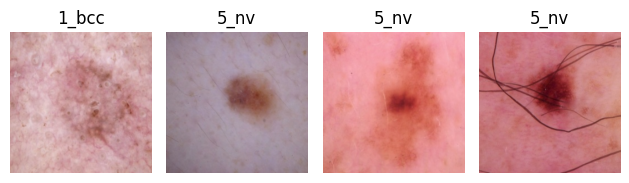

In [ ]:
X, Ys = train_datagen[2]
Y_img, Y_cls, Y_concept = Ys['out_img'], Ys['classifier256'], Ys['feature_map']
print(X.shape)
print(Y_cls.shape)
print(Y_concept.shape)

for i in range(4):
  plt.subplot(1, 4, i+1)
  plt.imshow((X[i]*255).astype(np.uint8))
  plt.axis('off')
  class_id = Y_cls[i].argmax()
  plt.title(str(class_id)+'_'+configs.CLASS_NAMES[class_id])
plt.tight_layout()
plt.show()

# Generator 256 x 256

In [ ]:
class GeneratorBuilder():
    def double_conv_block(self, x, n_filters):
        x = tf.keras.layers.Conv2D(n_filters, 3,
                                   padding="same", activation="relu")(x)
        x = tf.keras.layers.Conv2D(n_filters, 3,
                                   padding="same", activation="relu")(x)
        return x

    def downsample_block(self, x, n_filters):
        f = self.double_conv_block(x, n_filters)
        p = tf.keras.layers.MaxPool2D(2)(f)
        p = tf.keras.layers.Dropout(0.5)(p)
        return f, p

    def upsample_block(self, x, conv_features, n_filters):
        x = tf.keras.layers.Conv2DTranspose(n_filters, 3, 2, padding="same")(x)
        x = tf.keras.layers.concatenate([x, conv_features])
        x = tf.keras.layers.Dropout(0.5)(x)
        x = self.double_conv_block(x, n_filters)
        return x

    def build_unet_model(self, input_shape, classifier, extractor, name):
        inputs = tf.keras.layers.Input(shape=input_shape)

        f1, p1 = self.downsample_block(inputs, 64)      # 128
        f2, p2 = self.downsample_block(p1, 128)         # 64
        f3, p3 = self.downsample_block(p2, 256)         # 32
        f4, p4 = self.downsample_block(p3, 512)         # 16
        bottleneck = self.double_conv_block(p4, 512)
        u5 = self.upsample_block(bottleneck, f4, 512)   # 32
        u6 = self.upsample_block(u5, f3, 256)           # 64
        u7 = self.upsample_block(u6, f2, 128)           # 128
        u8 = self.upsample_block(u7, f1, 64)            # 256

        # out_img
        out_img = tf.keras.layers.Conv2D(3, 1, padding="same",
                                activation = "sigmoid", name="out_img")(u8)

        # outputs_class
        classifier.trainable = False
        out_cls = classifier(out_img)

        # outputs_concept
        extractor.trainable = False
        out_concept = extractor(out_img)


        unet_model = tf.keras.Model(inputs,
                                    outputs=[out_img, out_cls, out_concept],
                                    name=name)

        return unet_model

In [ ]:
classifier = tf.keras.models.load_model(configs.CLASSIFIER256_CHECKPOINT)
classifier.summary()

Model: "classifier256"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 resnet50 (Functional)       (None, 8, 8, 2048)        23587712  
                                                                 
 global_average_pooling2d (  (None, 2048)              0         
 GlobalAveragePooling2D)                                         
                                                                 
 dense (Dense)               (None, 7)                 14343     
                                                                 
 softmax (Softmax)           (None, 7)                 0         
                                                                 
Total params: 23602055 (90.03 MB)
Trainable params: 23548935 (89.83 MB)
Non-trainable params: 53120 (207.50 KB)
_________________________________________________________________


In [ ]:
extractor = tf.keras.models.Model(
    inputs=classifier.get_layer('resnet50').inputs,
    outputs=classifier.get_layer('resnet50').outputs,
    name='feature_map'
)
extractor.load_weights(configs.CLASSIFIER256_CHECKPOINT)

In [ ]:
model = GeneratorBuilder().build_unet_model(
    configs.IMAGE_SIZE,
    classifier,
    extractor,
    'generator256'
)
model.summary()

Model: "generator256"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 256, 256, 3)]        0         []                            
                                                                                                  
 conv2d (Conv2D)             (None, 256, 256, 64)         1792      ['input_1[0][0]']             
                                                                                                  
 conv2d_1 (Conv2D)           (None, 256, 256, 64)         36928     ['conv2d[0][0]']              
                                                                                                  
 max_pooling2d (MaxPooling2  (None, 128, 128, 64)         0         ['conv2d_1[0][0]']            
 D)                                                                                    

# Custom Loss

In [ ]:
model.outputs

[<KerasTensor: shape=(None, 256, 256, 3) dtype=float32 (created by layer 'out_img')>,
 <KerasTensor: shape=(None, 7) dtype=float32 (created by layer 'classifier256')>,
 <KerasTensor: shape=(None, 8, 8, 2048) dtype=float32 (created by layer 'feature_map')>]

In [ ]:
class CounterfactualCustomLoss(tf.keras.losses.Loss):
    def __init__(self):
        super(CounterfactualCustomLoss, self).__init__()

    def call(self, y_true, y_pred):
        return tf.reduce_mean(
                    tf.square(tf.reduce_sum(y_true * y_pred, axis=1)
                    )
                )

In [ ]:
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=1e-4),
              loss={'out_img':tf.losses.MeanSquaredError(),
                    'feature_map':tf.losses.MeanSquaredError(),
                    'classifier256':CounterfactualCustomLoss()},
              loss_weights={'out_img':1,
                            'feature_map':1/1000,
                            'classifier256':1/10},
              metrics=[])

# Training

In [ ]:
cb_early_stop = tf.keras.callbacks.EarlyStopping(
    monitor='val_loss',
    min_delta=1e-4,
    patience=5,
    verbose=1,
    mode='auto'
)
cb_model_checkpoint = tf.keras.callbacks.ModelCheckpoint(
    configs.CHECKPOINTS_DIR + '/' + model.name,
    monitor='val_loss',
    verbose=1,
    save_best_only=True,
    save_weights_only=True,
    mode='auto'
)
cb_reduce_lr = tf.keras.callbacks.ReduceLROnPlateau(
    monitor='val_loss',
    factor=0.1,
    patience=5,
    verbose=1,
    mode='auto',
    min_delta=1e-4,
    min_lr=0
)

callbacks = [cb_model_checkpoint,
             cb_reduce_lr,
             cb_early_stop]

In [ ]:
history = model.fit_generator(train_datagen,
                    epochs=2024,
                    verbose=1,
                    callbacks=callbacks,
                    validation_data=val_datagen)

pd.DataFrame.from_dict(history.history) \
            .to_csv(configs.CHECKPOINTS_DIR+'/'+
                    model.name+'/history_generator.csv',
                    index=False)

Epoch 1/2024
313/313 [==============================] - ETA: 0s - loss: 0.0173 - out_img_loss: 0.0108 - classifier256_loss: 0.0334 - feature_map_loss: 3.1261 
Epoch 1: val_loss improved from inf to 0.01262, saving model to checkpoints/generator256
313/313 [==============================] - 5908s 19s/step - loss: 0.0173 - out_img_loss: 0.0108 - classifier256_loss: 0.0334 - feature_map_loss: 3.1261 - val_loss: 0.0126 - val_out_img_loss: 0.0048 - val_classifier256_loss: 0.0513 - val_feature_map_loss: 2.6997 - lr: 1.0000e-04
Epoch 2/2024
313/313 [==============================] - ETA: 0s - loss: 0.0070 - out_img_loss: 0.0021 - classifier256_loss: 0.0219 - feature_map_loss: 2.7517
Epoch 2: val_loss improved from 0.01262 to 0.01094, saving model to checkpoints/generator256
313/313 [==============================] - 480s 2s/step - loss: 0.0070 - out_img_loss: 0.0021 - classifier256_loss: 0.0219 - feature_map_loss: 2.7517 - val_loss: 0.0109 - val_out_img_loss: 0.0055 - val_classifier256_loss: 

OSError: Cannot save file into a non-existent directory: 'checkpoints/generator256'

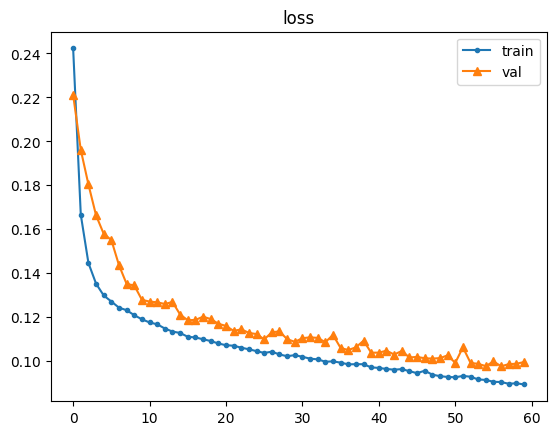

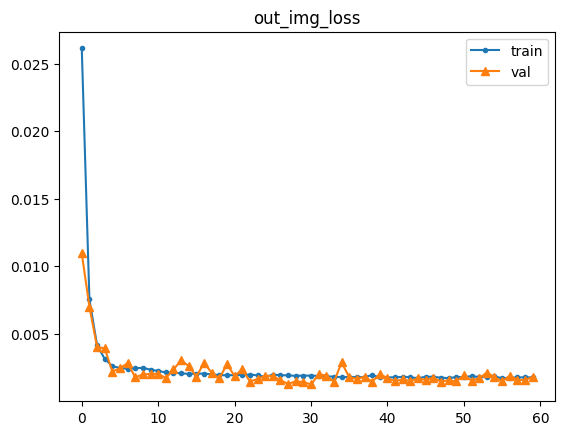

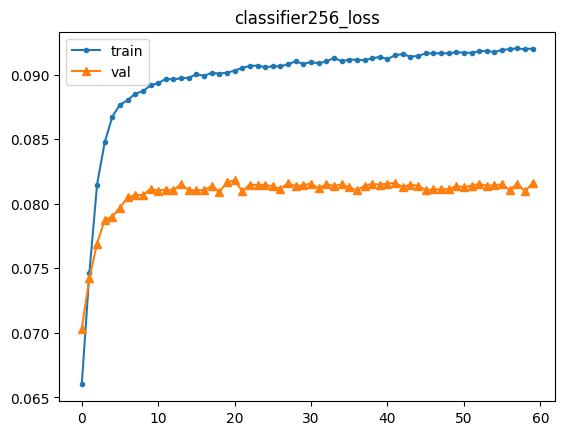

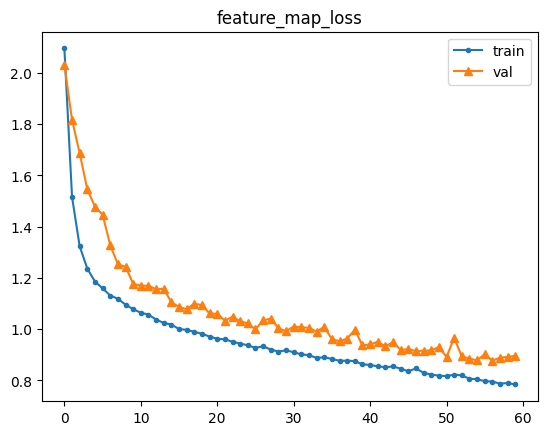

In [ ]:
df = pd.read_csv('checkpoints/generator256/history_generator.csv')

plt.plot(df['loss'], label='train', marker='.')
plt.plot(df['val_loss'], label='val', marker='^')
plt.legend()
plt.title('loss')
plt.show()

plt.plot(df['out_img_loss'], label='train', marker='.')
plt.plot(df['val_out_img_loss'], label='val', marker='^')
plt.legend()
plt.title('out_img_loss')
plt.show()

plt.plot(df['classifier256_loss'], label='train', marker='.')
plt.plot(df['val_classifier256_loss'], label='val', marker='^')
plt.legend()
plt.title('classifier256_loss')
plt.show()

plt.plot(df['feature_map_loss'], label='train', marker='.')
plt.plot(df['val_feature_map_loss'], label='val', marker='^')
plt.legend()
plt.title('feature_map_loss')
plt.show()

# Evaluation - Images

In [47]:
model.load_weights('/content/XAI-CV-CounterfactualSamples/exp_ham10k/checkpoints/generator256/generator256')

In [48]:
train_loss = model.evaluate_generator(train_datagen, verbose=1)
val_loss = model.evaluate_generator(val_datagen, verbose=1)
test_loss = model.evaluate_generator(test_datagen, verbose=1)
print(train_loss, val_loss, test_loss)

189/189 [==============================] - 2379s 13s/step - loss: 0.0040 - out_img_loss: 4.5232e-04 - classifier256_loss: 0.0146 - feature_map_loss: 2.0414
[0.004254356492310762, 0.0004503122472669929, 0.014476427808403969, 2.356401205062866] [0.003948213066905737, 0.0004492676816880703, 0.01472831703722477, 2.026113510131836] [0.003955622669309378, 0.00045232370030134916, 0.01461878977715969, 2.0414204597473145]


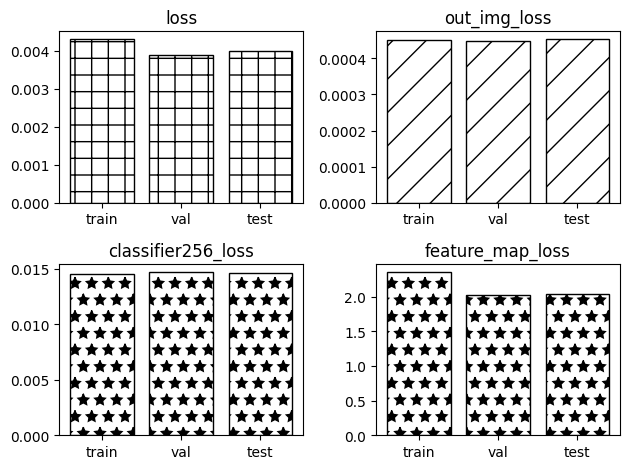

In [50]:
plt.subplot(2, 2, 1)
plt.bar(['train', 'val', 'test'], [0.0043, 0.0039, 0.0040], color='white',
                                edgecolor='black', hatch='+')
plt.title('loss')

plt.subplot(2, 2, 2)
plt.bar(['train', 'val', 'test'], [4.5031e-04, 4.4927e-04, 4.5232e-04], color='white',
                                edgecolor='black', hatch='/')
plt.title('out_img_loss')

plt.subplot(2, 2, 3)
plt.bar(['train', 'val', 'test'], [0.0145, 0.0147, 0.0146], color='white',
                                edgecolor='black', hatch='*')
plt.title('classifier256_loss')

plt.subplot(2, 2, 4)
plt.bar(['train', 'val', 'test'], [2.3564, 2.0261, 2.0414], color='white',
                                edgecolor='black', hatch='*')
plt.title('feature_map_loss')

plt.tight_layout()
plt.show()

In [51]:
def plot_generated_images(X, generator, classifier, num=-1):
  X_, Y_, Z_ = generator.predict(X, verbose=0)
  Y_cls_original = classifier.predict(X)
  Y_cls_counter = classifier.predict(X_)
  D = X - X_
  print(X_.shape, Y_.shape)

  num = 4 if num > 0 else X.shape[0]
  np.set_printoptions(precision=4)
  for i in range(num):
    print(f'*** sample {i}')
    print(Y_cls_original[i])
    print(Y_cls_counter[i])

    plt.subplot(1, 3, 1)
    plt.imshow((X[i]*255).astype(np.uint8))
    plt.axis('off')
    plt.title('original')

    plt.subplot(1, 3, 2)
    plt.imshow((X_[i]*255).astype(np.uint8))
    plt.axis('off')
    plt.title('counterfactual')

    heatmap = (D[i]**2).sum(axis=2)
    heatmap = (heatmap - heatmap.min()) / (heatmap.max() - heatmap.min())

    plt.subplot(1, 3, 3)
    plt.imshow(heatmap)
    plt.axis('off')
    plt.title('difference')

    plt.show()

## train

1/1 [==============================] - 0s 36ms/step
(16, 256, 256, 3) (16, 7)
*** sample 0
[0.1147 0.1147 0.1147 0.1147 0.1147 0.3118 0.1147]
[0.1275 0.1275 0.2099 0.1286 0.1275 0.1325 0.1464]


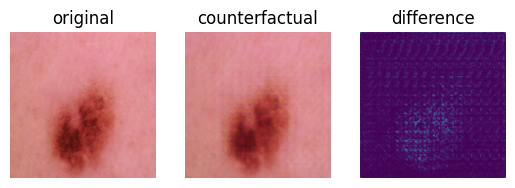

*** sample 1
[0.1147 0.1147 0.1147 0.1147 0.1147 0.3118 0.1147]
[0.104  0.1056 0.1045 0.1988 0.1049 0.1042 0.278 ]


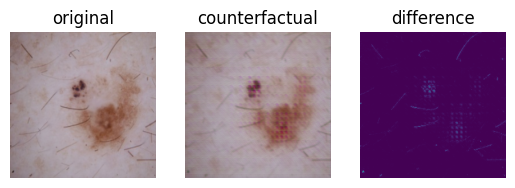

*** sample 2
[0.1147 0.1148 0.3118 0.1147 0.1147 0.1147 0.1147]
[0.1024 0.1059 0.1047 0.2616 0.1043 0.1016 0.2196]


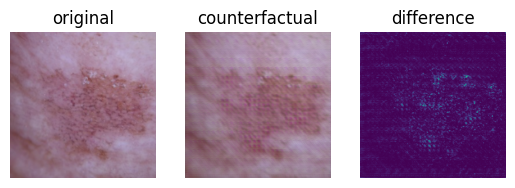

*** sample 3
[0.1147 0.1147 0.1147 0.1147 0.1149 0.3117 0.1147]
[0.1134 0.1134 0.1136 0.1382 0.1135 0.1167 0.2913]


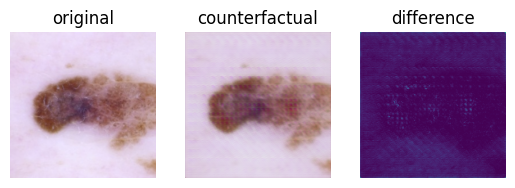

*** sample 4
[0.1147 0.1147 0.3118 0.1147 0.1147 0.1147 0.1147]
[0.1247 0.1251 0.1538 0.1544 0.136  0.1246 0.1813]


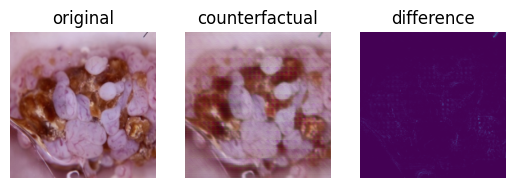

*** sample 5
[0.1147 0.1147 0.1147 0.1147 0.1147 0.3118 0.1147]
[0.1266 0.1266 0.2314 0.1273 0.1266 0.1311 0.1304]


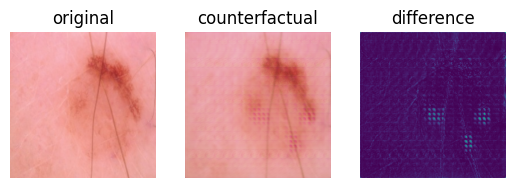

*** sample 6
[0.1147 0.1147 0.1147 0.1147 0.1147 0.3118 0.1147]
[0.103  0.1077 0.1037 0.2126 0.1063 0.1034 0.2633]


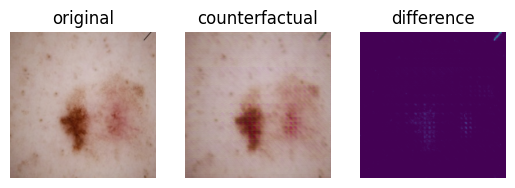

*** sample 7
[0.1147 0.1147 0.1147 0.1147 0.1147 0.3118 0.1147]
[0.121  0.121  0.2671 0.1212 0.121  0.1254 0.1233]


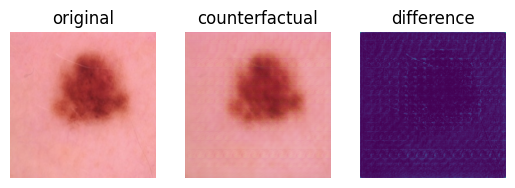

*** sample 8
[0.1148 0.1147 0.1147 0.1147 0.1147 0.3117 0.1148]
[0.1055 0.114  0.1112 0.2201 0.1069 0.1058 0.2364]


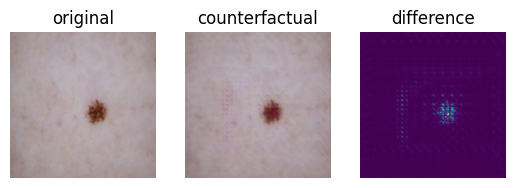

*** sample 9
[0.1147 0.1147 0.1147 0.1147 0.1147 0.3118 0.1147]
[0.1107 0.1111 0.1107 0.1459 0.1109 0.1119 0.2987]


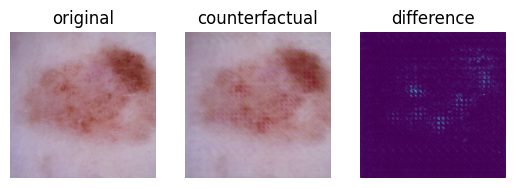

*** sample 10
[0.1147 0.1147 0.1147 0.1147 0.1147 0.3118 0.1147]
[0.1304 0.1304 0.2017 0.1312 0.1304 0.1323 0.1434]


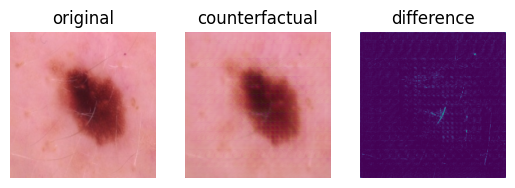

*** sample 11
[0.1098 0.1098 0.1527 0.1098 0.2983 0.1098 0.1098]
[0.1016 0.1038 0.1034 0.2318 0.1042 0.1024 0.2527]


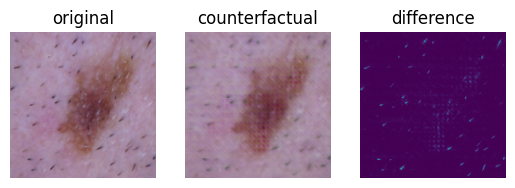

*** sample 12
[0.1147 0.1147 0.1147 0.1147 0.1147 0.1147 0.3118]
[0.1035 0.1052 0.2022 0.2718 0.104  0.1032 0.1102]


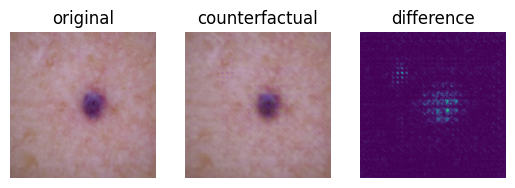

*** sample 13
[0.1147 0.1147 0.3118 0.1147 0.1147 0.1147 0.1147]
[0.0983 0.1001 0.0986 0.2626 0.0988 0.0983 0.2431]


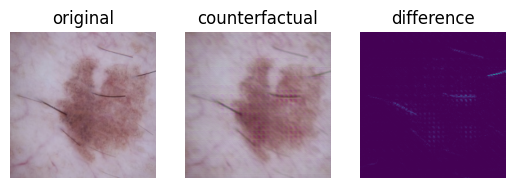

*** sample 14
[0.1147 0.1147 0.1147 0.1147 0.1147 0.3118 0.1147]
[0.1331 0.1331 0.152  0.1335 0.1331 0.1417 0.1735]


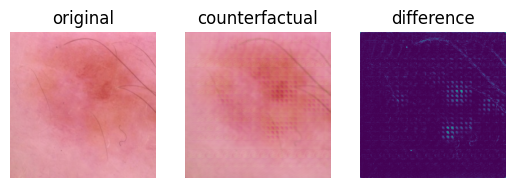

*** sample 15
[0.1147 0.1147 0.1147 0.1147 0.1147 0.3118 0.1147]
[0.1215 0.1215 0.2603 0.1216 0.1215 0.1315 0.122 ]


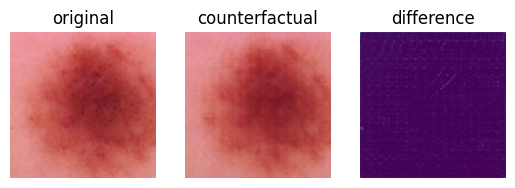

In [52]:
plot_generated_images(train_datagen[0][0], model, classifier)

1/1 [==============================] - 0s 46ms/step
(16, 256, 256, 3) (16, 7)
*** sample 0
[0.1147 0.1147 0.1147 0.1147 0.1147 0.3118 0.1147]
[0.1058 0.1081 0.1077 0.2077 0.1062 0.1126 0.2519]


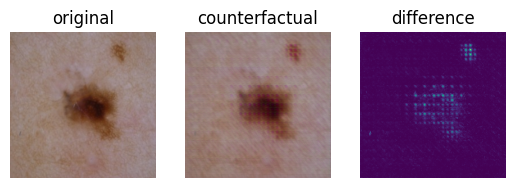

*** sample 1
[0.1147 0.1147 0.1147 0.1147 0.1147 0.3118 0.1147]
[0.1154 0.1154 0.3055 0.1156 0.1154 0.1167 0.1161]


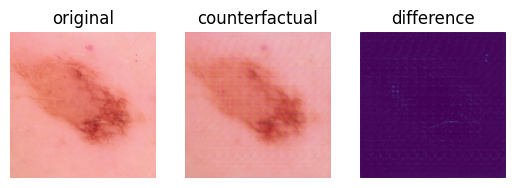

*** sample 2
[0.1147 0.1147 0.3118 0.1147 0.1147 0.1147 0.1147]
[0.1046 0.1063 0.1057 0.2037 0.105  0.1071 0.2676]


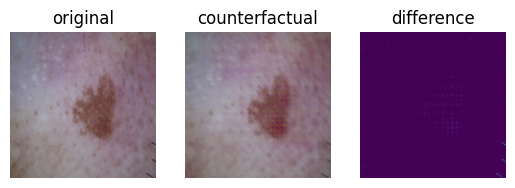

*** sample 3
[0.2993 0.15   0.1101 0.1102 0.1101 0.1101 0.1101]
[0.0979 0.1009 0.098  0.2617 0.0982 0.0978 0.2455]


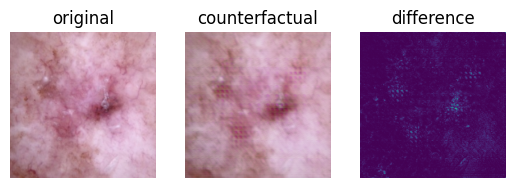

*** sample 4
[0.1147 0.1147 0.1147 0.1147 0.1147 0.3118 0.1147]
[0.1151 0.1151 0.3045 0.1153 0.1151 0.1193 0.1157]


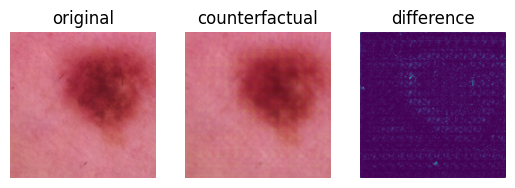

*** sample 5
[0.1147 0.1147 0.1147 0.1147 0.1147 0.3118 0.1147]
[0.123  0.123  0.2324 0.1242 0.123  0.1496 0.1247]


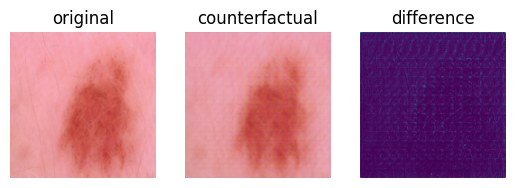

*** sample 6
[0.1147 0.1147 0.1147 0.1147 0.1147 0.3118 0.1147]
[0.115  0.115  0.3084 0.1152 0.115  0.1158 0.1156]


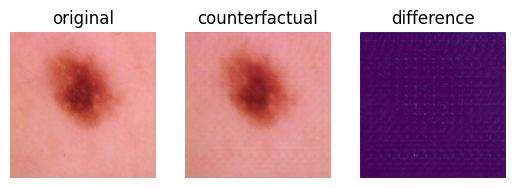

*** sample 7
[0.1147 0.1147 0.1147 0.1147 0.1147 0.3118 0.1147]
[0.1105 0.1116 0.1115 0.148  0.1113 0.1111 0.2959]


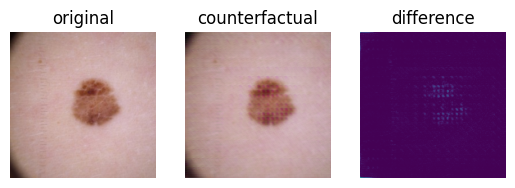

*** sample 8
[0.1147 0.1147 0.1147 0.1147 0.1147 0.3118 0.1147]
[0.1096 0.11   0.1101 0.1558 0.1096 0.1355 0.2693]


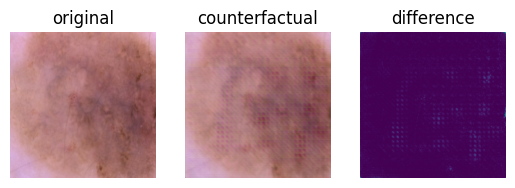

*** sample 9
[0.3035 0.1159 0.1159 0.1147 0.1144 0.1212 0.1144]
[0.1099 0.1193 0.1369 0.2262 0.1137 0.1089 0.185 ]


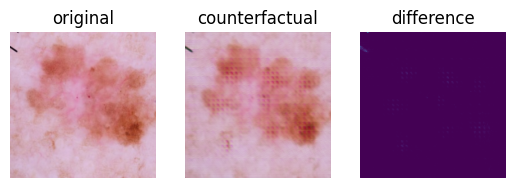

*** sample 10
[0.1147 0.1147 0.1147 0.1147 0.1147 0.3118 0.1147]
[0.1188 0.1188 0.1323 0.1234 0.1188 0.1217 0.2663]


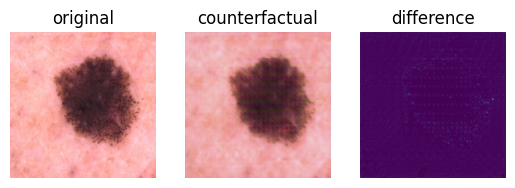

*** sample 11
[0.1147 0.1147 0.1147 0.1147 0.1147 0.3118 0.1147]
[0.1014 0.1042 0.1017 0.2398 0.1022 0.1017 0.2488]


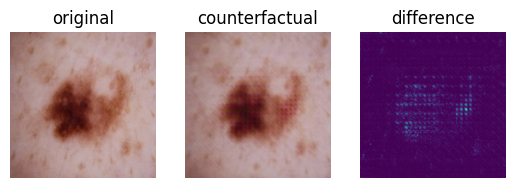

*** sample 12
[0.1147 0.1147 0.1147 0.1147 0.1147 0.3118 0.1147]
[0.1163 0.1163 0.2962 0.1165 0.1163 0.1216 0.1169]


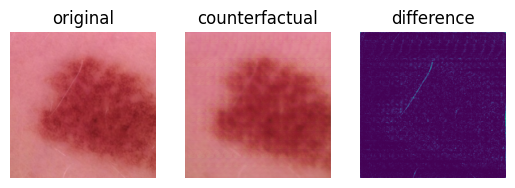

*** sample 13
[0.1147 0.1147 0.1147 0.1147 0.1147 0.3118 0.1147]
[0.1157 0.1157 0.3034 0.1158 0.1157 0.1176 0.1161]


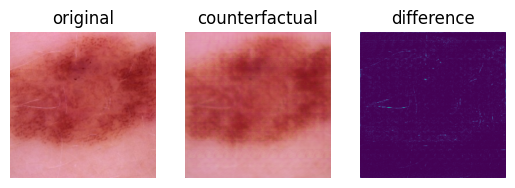

*** sample 14
[0.1147 0.1147 0.1147 0.1147 0.1147 0.3118 0.1147]
[0.1143 0.1143 0.1146 0.1197 0.1143 0.1144 0.3083]


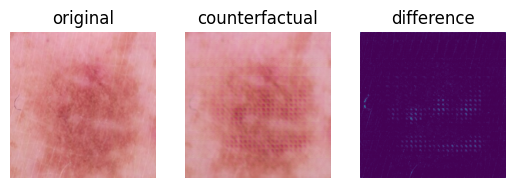

*** sample 15
[0.1147 0.1147 0.1147 0.1147 0.1147 0.3118 0.1147]
[0.1032 0.1092 0.1036 0.2183 0.1042 0.1053 0.2562]


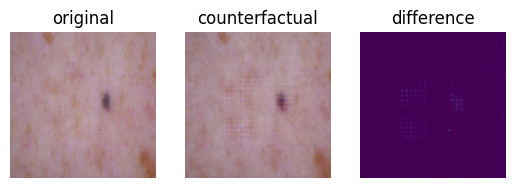

In [53]:
plot_generated_images(train_datagen[32][0], model, classifier)

1/1 [==============================] - 0s 34ms/step
(16, 256, 256, 3) (16, 7)
*** sample 0
[0.108  0.1079 0.1097 0.108  0.2357 0.2228 0.1079]
[0.1086 0.114  0.1138 0.2285 0.1097 0.1106 0.2148]


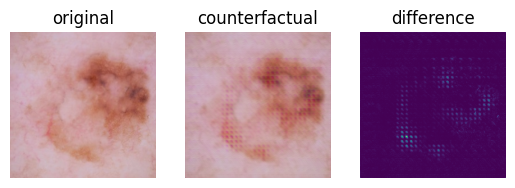

*** sample 1
[0.1147 0.1147 0.1147 0.1147 0.1147 0.3118 0.1147]
[0.115  0.115  0.308  0.1153 0.115  0.1153 0.1163]


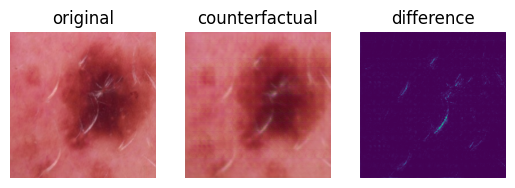

*** sample 2
[0.1147 0.1147 0.1147 0.1147 0.1147 0.3118 0.1147]
[0.1148 0.1148 0.3054 0.1168 0.1148 0.1168 0.1166]


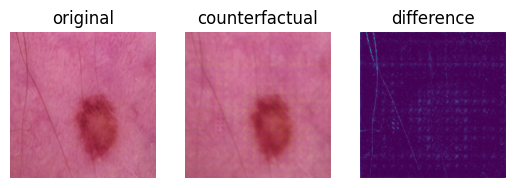

*** sample 3
[0.1147 0.1148 0.1147 0.1147 0.3117 0.1147 0.1147]
[0.1088 0.1202 0.1096 0.2798 0.1171 0.1087 0.1557]


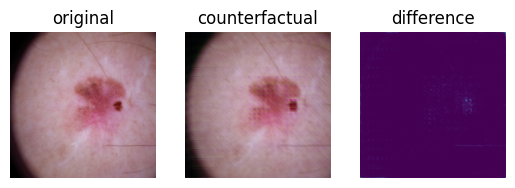

*** sample 4
[0.1147 0.1147 0.1147 0.1147 0.1147 0.3118 0.1147]
[0.1277 0.1277 0.2088 0.128  0.1277 0.1311 0.149 ]


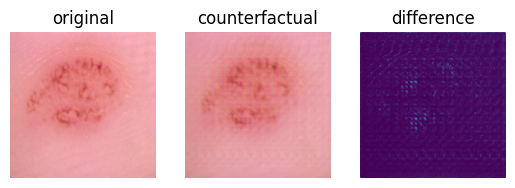

*** sample 5
[0.1032 0.1032 0.1032 0.1032 0.2033 0.2805 0.1032]
[0.1125 0.1128 0.1139 0.1348 0.1127 0.1127 0.3005]


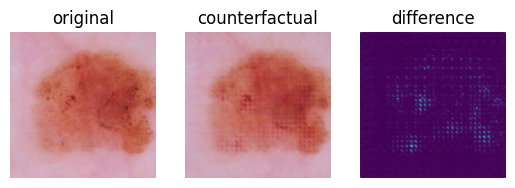

*** sample 6
[0.1147 0.1147 0.1148 0.1147 0.1147 0.3118 0.1147]
[0.1021 0.1025 0.1043 0.268  0.1024 0.1022 0.2186]


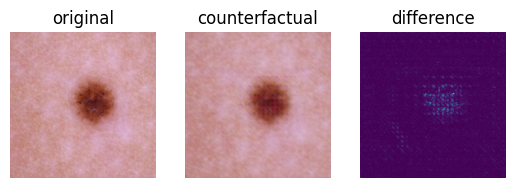

*** sample 7
[0.1147 0.1147 0.1147 0.1147 0.1147 0.3118 0.1147]
[0.1208 0.1208 0.2568 0.1224 0.1208 0.126  0.1326]


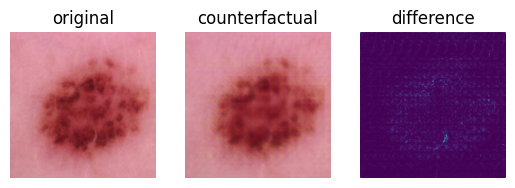

*** sample 8
[0.1147 0.1147 0.1149 0.1147 0.1147 0.3117 0.1147]
[0.1068 0.1105 0.1074 0.1765 0.1074 0.1072 0.2843]


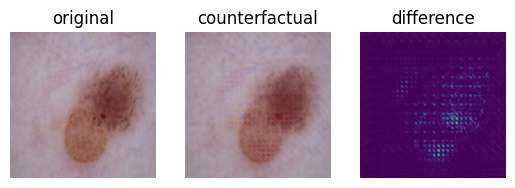

*** sample 9
[0.1147 0.1147 0.1147 0.1147 0.1147 0.3118 0.1147]
[0.1152 0.1152 0.306  0.1154 0.1152 0.1174 0.1156]


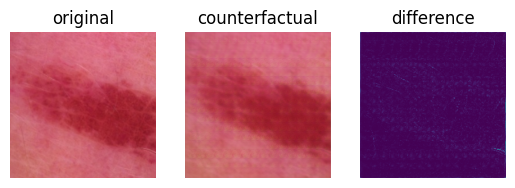

*** sample 10
[0.1147 0.1147 0.1147 0.1147 0.1147 0.3118 0.1147]
[0.1154 0.1154 0.3024 0.1157 0.1154 0.1193 0.1165]


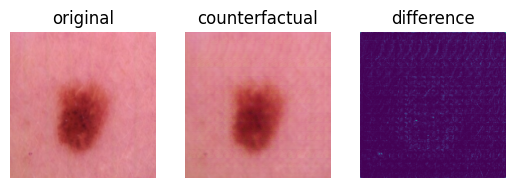

*** sample 11
[0.1147 0.1147 0.1149 0.1147 0.1147 0.3117 0.1147]
[0.1057 0.1061 0.1147 0.2626 0.1064 0.1058 0.1986]


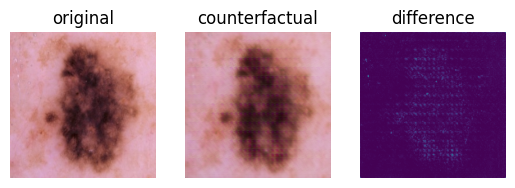

*** sample 12
[0.1147 0.1147 0.1147 0.1147 0.1147 0.3118 0.1147]
[0.1079 0.1104 0.1084 0.1648 0.1083 0.1202 0.2801]


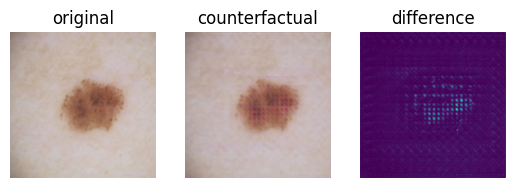

*** sample 13
[0.1147 0.1147 0.1147 0.1147 0.1147 0.3118 0.1147]
[0.1163 0.1162 0.2963 0.1176 0.1163 0.1196 0.1177]


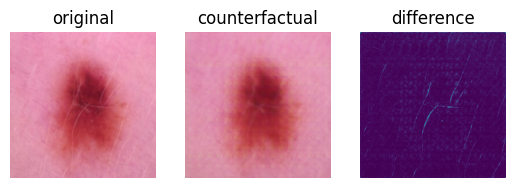

*** sample 14
[0.1147 0.1147 0.1147 0.1147 0.1147 0.3118 0.1147]
[0.117  0.117  0.2926 0.1177 0.117  0.1205 0.1181]


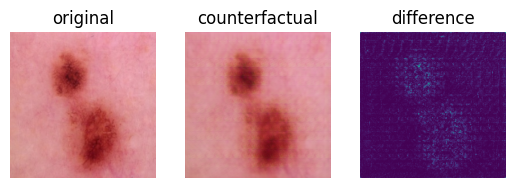

*** sample 15
[0.1147 0.1147 0.1147 0.1147 0.1147 0.3118 0.1147]
[0.103  0.105  0.1049 0.2311 0.1038 0.1049 0.2472]


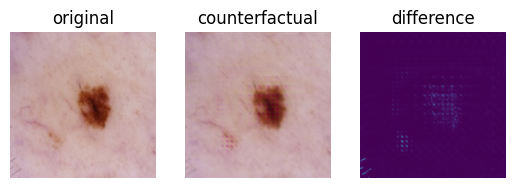

In [54]:
plot_generated_images(train_datagen[64][0], model, classifier)

## validation

1/1 [==============================] - 0s 30ms/step
(16, 256, 256, 3) (16, 7)
*** sample 0
[0.1155 0.1201 0.1418 0.1153 0.2646 0.1275 0.1152]
[0.1025 0.1036 0.1027 0.2133 0.103  0.1025 0.2724]


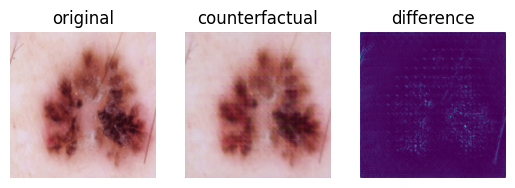

*** sample 1
[0.3117 0.1147 0.1147 0.1147 0.1147 0.1148 0.1147]
[0.1023 0.1082 0.105  0.2513 0.1031 0.1022 0.228 ]


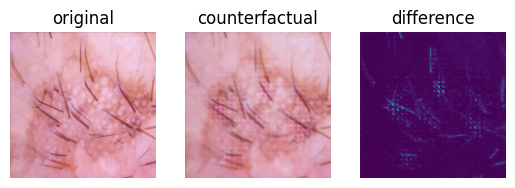

*** sample 2
[0.1374 0.1371 0.136  0.1363 0.1428 0.1744 0.1359]
[0.1168 0.1201 0.1415 0.1868 0.1183 0.1175 0.199 ]


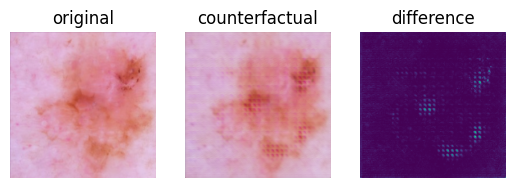

*** sample 3
[0.1097 0.1108 0.1098 0.1097 0.2122 0.2381 0.1097]
[0.1126 0.1183 0.1188 0.2281 0.1148 0.1131 0.1942]


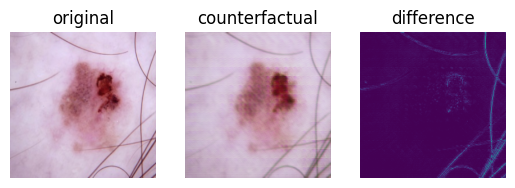

*** sample 4
[0.3118 0.1148 0.1147 0.1147 0.1147 0.1147 0.1147]
[0.0999 0.1162 0.0999 0.2396 0.1    0.0997 0.2447]


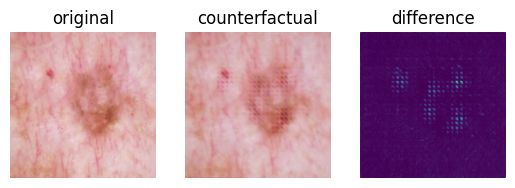

*** sample 5
[0.1128 0.1137 0.1685 0.1128 0.1154 0.264  0.1128]
[0.0983 0.0988 0.0986 0.2538 0.0985 0.0983 0.2537]


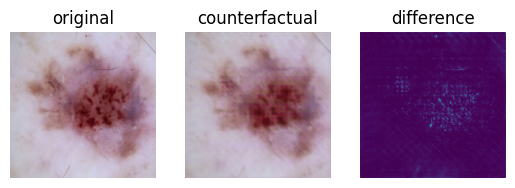

*** sample 6
[0.3117 0.1148 0.1147 0.1147 0.1147 0.1147 0.1147]
[0.1018 0.1043 0.1052 0.2208 0.1021 0.1015 0.2643]


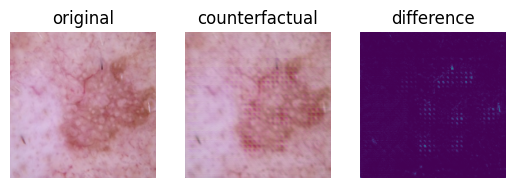

*** sample 7
[0.3016 0.111  0.1432 0.1111 0.111  0.111  0.111 ]
[0.1083 0.1167 0.1088 0.1772 0.1101 0.1086 0.2703]


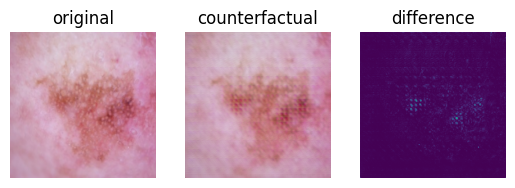

*** sample 8
[0.3118 0.1147 0.1147 0.1147 0.1147 0.1147 0.1147]
[0.104  0.1229 0.1044 0.1894 0.1042 0.1038 0.2713]


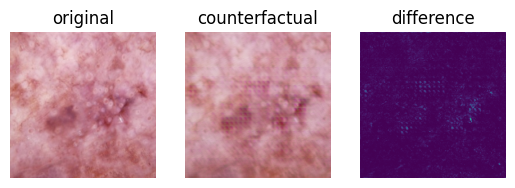

*** sample 9
[0.2978 0.1518 0.1115 0.1097 0.1097 0.1097 0.1097]
[0.1131 0.1622 0.1232 0.2343 0.1113 0.111  0.1448]


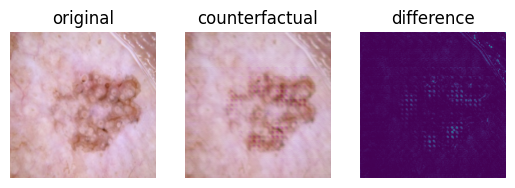

*** sample 10
[0.3118 0.1147 0.1147 0.1147 0.1147 0.1148 0.1147]
[0.1237 0.124  0.1277 0.1432 0.1239 0.1241 0.2334]


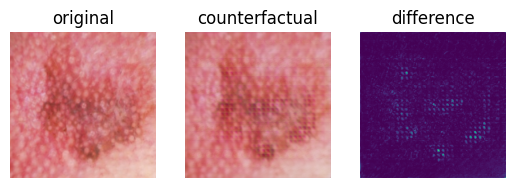

*** sample 11
[0.1997 0.1571 0.1804 0.1216 0.1142 0.1136 0.1135]
[0.1035 0.1107 0.1055 0.2428 0.104  0.1034 0.2301]


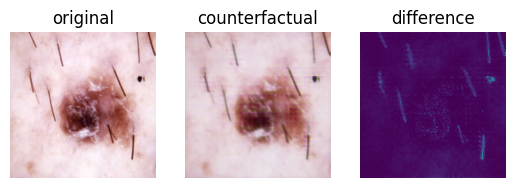

*** sample 12
[0.1067 0.2791 0.1872 0.1067 0.1068 0.1067 0.1068]
[0.1066 0.1089 0.1097 0.2204 0.1069 0.107  0.2405]


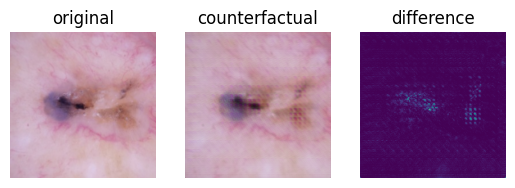

*** sample 13
[0.251  0.1135 0.1256 0.1114 0.1111 0.1766 0.1108]
[0.1047 0.1091 0.1069 0.2191 0.1061 0.1047 0.2493]


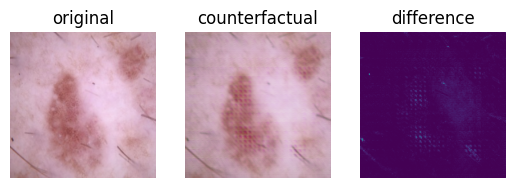

*** sample 14
[0.306  0.1126 0.1126 0.1126 0.1126 0.1309 0.1126]
[0.1054 0.1109 0.1073 0.2057 0.106  0.1052 0.2595]


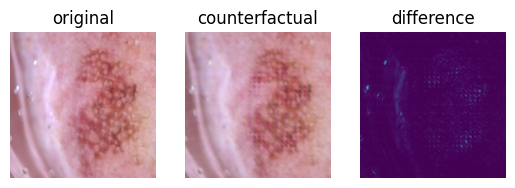

*** sample 15
[0.1962 0.2561 0.1176 0.1074 0.1067 0.1091 0.1069]
[0.1051 0.1651 0.1098 0.1681 0.1062 0.1049 0.2407]


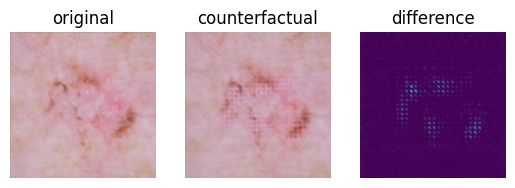

In [55]:
plot_generated_images(val_datagen[0][0], model, classifier)

1/1 [==============================] - 0s 35ms/step
(16, 256, 256, 3) (16, 7)
*** sample 0
[0.109  0.1153 0.2599 0.1091 0.109  0.1887 0.109 ]
[0.1068 0.1104 0.1091 0.2405 0.1078 0.1081 0.2172]


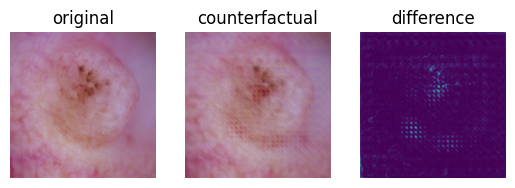

*** sample 1
[0.1147 0.1147 0.1147 0.1147 0.1147 0.3118 0.1147]
[0.1225 0.1225 0.2555 0.123  0.1225 0.1302 0.1238]


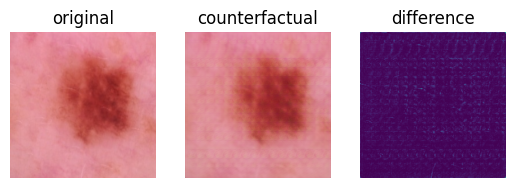

*** sample 2
[0.1147 0.1147 0.1147 0.1147 0.1147 0.3118 0.1147]
[0.1189 0.1189 0.2762 0.1192 0.1189 0.1281 0.1199]


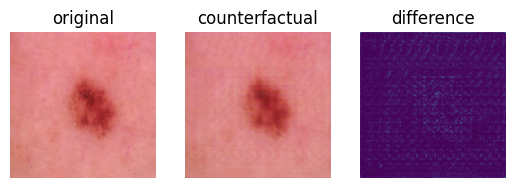

*** sample 3
[0.1147 0.1147 0.1147 0.1147 0.1147 0.3118 0.1147]
[0.1023 0.1041 0.1046 0.2656 0.1034 0.1025 0.2175]


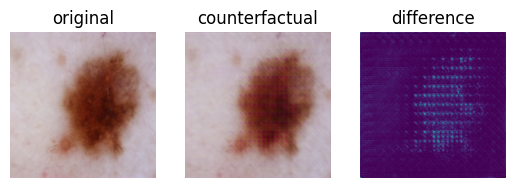

*** sample 4
[0.1147 0.1147 0.1147 0.1147 0.1147 0.3118 0.1147]
[0.1338 0.1341 0.1407 0.1425 0.1338 0.1697 0.1454]


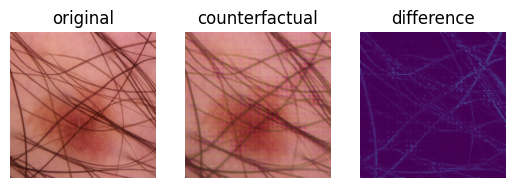

*** sample 5
[0.1147 0.1147 0.1147 0.1147 0.1147 0.3118 0.1147]
[0.1159 0.1158 0.2933 0.1181 0.1159 0.1192 0.1219]


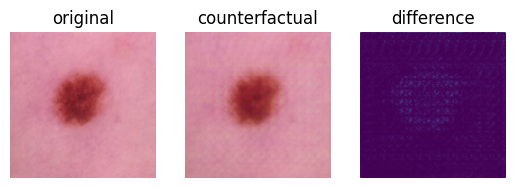

*** sample 6
[0.1147 0.1147 0.1147 0.1147 0.1147 0.3118 0.1147]
[0.1182 0.1182 0.122  0.1184 0.1182 0.1195 0.2856]


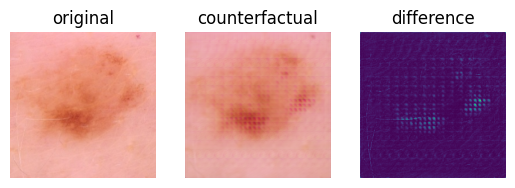

*** sample 7
[0.1147 0.1147 0.1147 0.1147 0.1147 0.3118 0.1147]
[0.1117 0.1129 0.112  0.1838 0.1119 0.1252 0.2425]


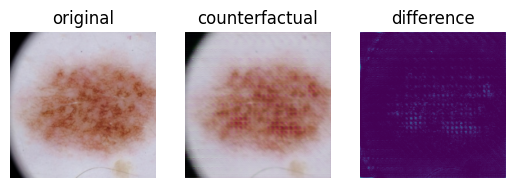

*** sample 8
[0.1147 0.1147 0.1147 0.1147 0.1147 0.3118 0.1147]
[0.1173 0.1173 0.118  0.1179 0.1173 0.1204 0.2918]


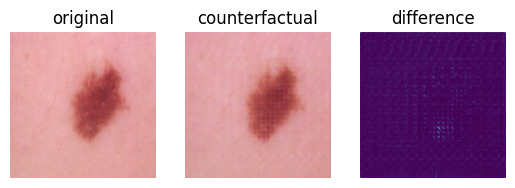

*** sample 9
[0.1091 0.1099 0.2949 0.1095 0.1093 0.158  0.1094]
[0.0998 0.0999 0.1002 0.2297 0.0999 0.0998 0.2708]


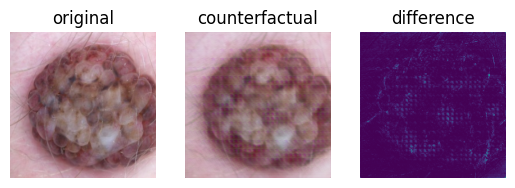

*** sample 10
[0.1147 0.1147 0.1147 0.1147 0.1147 0.3118 0.1147]
[0.1311 0.1311 0.1803 0.1317 0.1311 0.1551 0.1395]


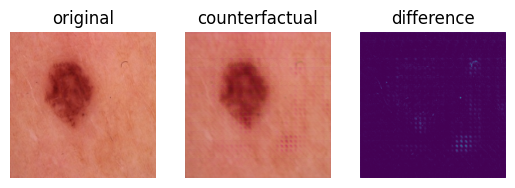

*** sample 11
[0.1051 0.1051 0.1052 0.1051 0.189  0.2853 0.1052]
[0.1051 0.1083 0.1085 0.2673 0.1077 0.1052 0.1978]


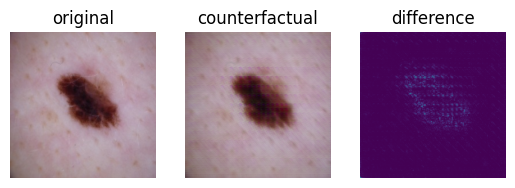

*** sample 12
[0.1144 0.1144 0.1144 0.1144 0.1169 0.311  0.1144]
[0.1154 0.1154 0.1231 0.1395 0.1155 0.1291 0.262 ]


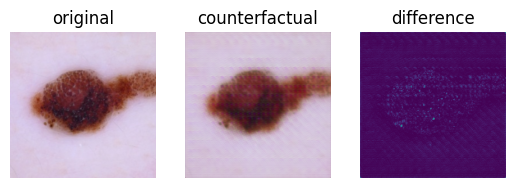

*** sample 13
[0.1147 0.1147 0.1147 0.1147 0.1147 0.3118 0.1147]
[0.1188 0.1188 0.2824 0.119  0.1188 0.1191 0.1229]


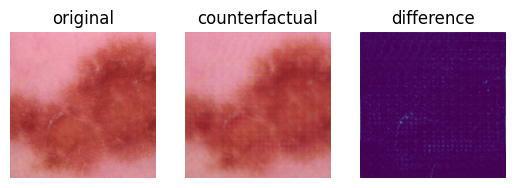

*** sample 14
[0.1147 0.1147 0.1147 0.1147 0.1147 0.3118 0.1147]
[0.1169 0.1169 0.2803 0.1197 0.1169 0.1304 0.1189]


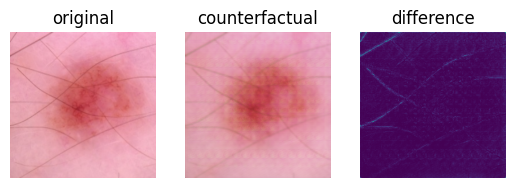

*** sample 15
[0.1147 0.1147 0.1147 0.1147 0.1147 0.3118 0.1147]
[0.1016 0.1034 0.1032 0.2592 0.1042 0.1016 0.2267]


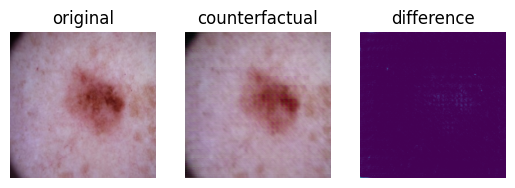

In [56]:
plot_generated_images(val_datagen[32][0], model, classifier)

1/1 [==============================] - 0s 33ms/step
(16, 256, 256, 3) (16, 7)
*** sample 0
[0.1147 0.1147 0.1147 0.1147 0.1147 0.3117 0.1149]
[0.1074 0.1097 0.1075 0.1696 0.1075 0.1075 0.2908]


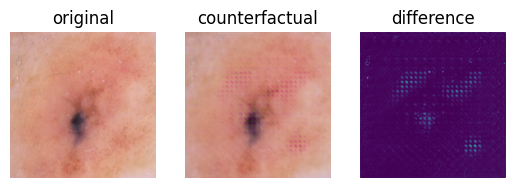

*** sample 1
[0.1145 0.1146 0.1146 0.1145 0.1145 0.3111 0.1163]
[0.1028 0.1061 0.1064 0.2505 0.1044 0.1036 0.2262]


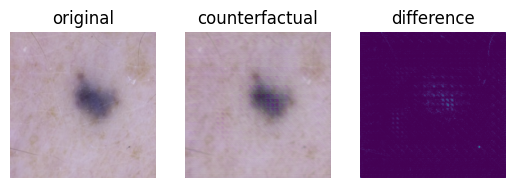

*** sample 2
[0.1147 0.1147 0.1147 0.1147 0.1147 0.3118 0.1147]
[0.1212 0.1212 0.2634 0.1215 0.1212 0.1266 0.1249]


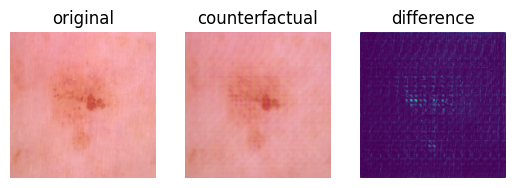

*** sample 3
[0.1147 0.1147 0.1147 0.1147 0.1147 0.3118 0.1147]
[0.1248 0.1248 0.2364 0.1254 0.1248 0.1336 0.1301]


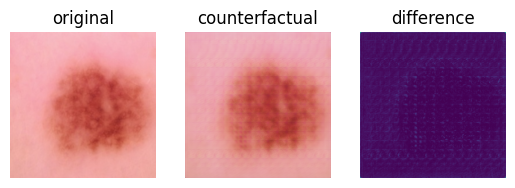

*** sample 4
[0.1147 0.1147 0.1147 0.1147 0.1147 0.3118 0.1147]
[0.105  0.1096 0.1088 0.2132 0.1063 0.1053 0.2518]


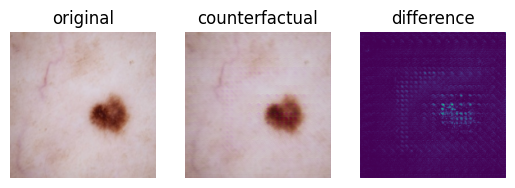

*** sample 5
[0.1147 0.1147 0.1148 0.1147 0.1148 0.3117 0.1147]
[0.1026 0.1035 0.1082 0.2237 0.1033 0.1028 0.2559]


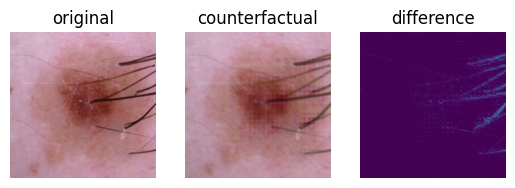

*** sample 6
[0.1147 0.1147 0.1147 0.1147 0.1147 0.3118 0.1147]
[0.1208 0.1208 0.2466 0.1337 0.1209 0.1225 0.1346]


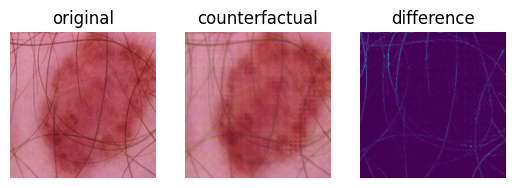

*** sample 7
[0.1147 0.1147 0.1147 0.1147 0.1147 0.3118 0.1147]
[0.1049 0.1078 0.109  0.2029 0.1078 0.1045 0.2631]


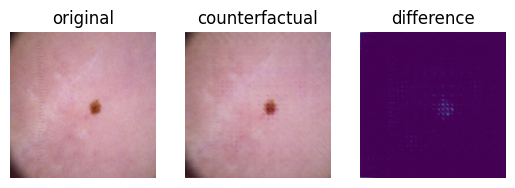

*** sample 8
[0.1147 0.1147 0.1147 0.1147 0.1147 0.3118 0.1147]
[0.1087 0.1154 0.1098 0.1816 0.1095 0.1096 0.2654]


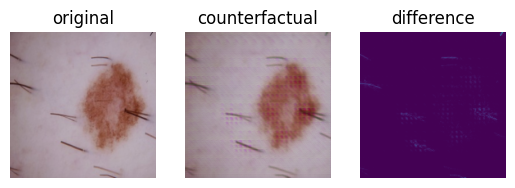

*** sample 9
[0.1147 0.1147 0.1147 0.1147 0.1147 0.3118 0.1147]
[0.1251 0.1251 0.2256 0.1296 0.1251 0.1289 0.1407]


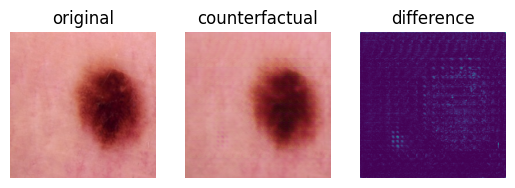

*** sample 10
[0.1147 0.1147 0.1147 0.1147 0.1147 0.3118 0.1147]
[0.1341 0.1341 0.1374 0.1604 0.1341 0.1437 0.1562]


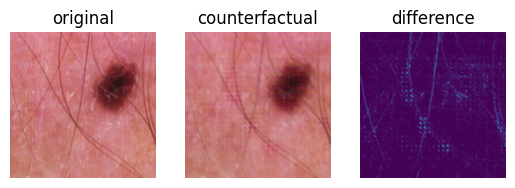

*** sample 11
[0.1147 0.1147 0.1147 0.1147 0.1147 0.3118 0.1147]
[0.1267 0.1267 0.1532 0.1272 0.1267 0.1274 0.2121]


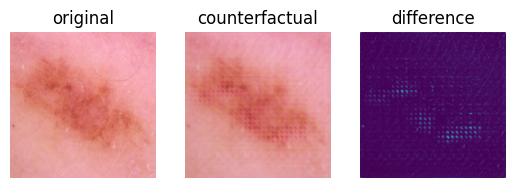

*** sample 12
[0.1147 0.1147 0.1147 0.1147 0.1147 0.3118 0.1147]
[0.1178 0.1178 0.287  0.1179 0.1178 0.1236 0.1181]


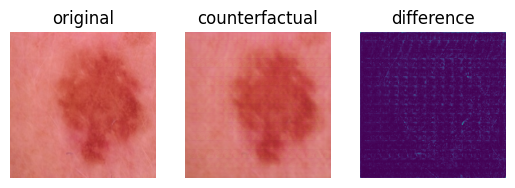

*** sample 13
[0.1147 0.1147 0.1147 0.1147 0.1147 0.3118 0.1147]
[0.1193 0.1193 0.273  0.1205 0.1193 0.124  0.1245]


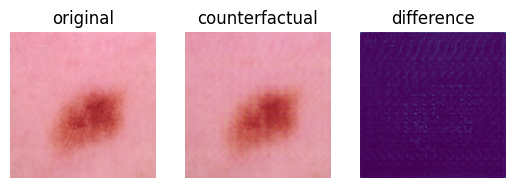

*** sample 14
[0.1147 0.1147 0.1147 0.1147 0.1147 0.3118 0.1147]
[0.1117 0.2214 0.1132 0.1311 0.113  0.1178 0.1918]


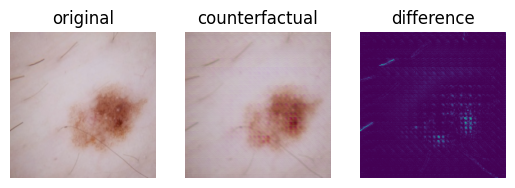

*** sample 15
[0.1147 0.1147 0.1147 0.1147 0.1147 0.3118 0.1147]
[0.1173 0.1173 0.2909 0.1176 0.1173 0.1209 0.1187]


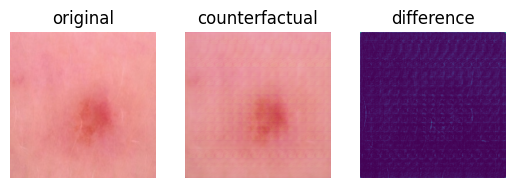

In [57]:
plot_generated_images(val_datagen[64][0], model, classifier)

## test

1/1 [==============================] - 0s 38ms/step
(16, 256, 256, 3) (16, 7)
*** sample 0
[0.146  0.1276 0.1289 0.125  0.1311 0.2166 0.1247]
[0.1179 0.1192 0.1346 0.1357 0.1189 0.1179 0.2558]


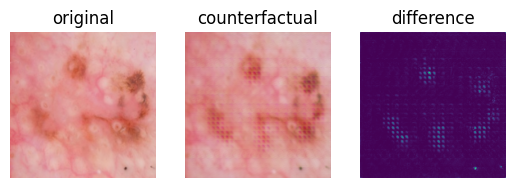

*** sample 1
[0.3098 0.1149 0.1194 0.114  0.114  0.114  0.114 ]
[0.0974 0.0984 0.0976 0.2546 0.0976 0.0973 0.2571]


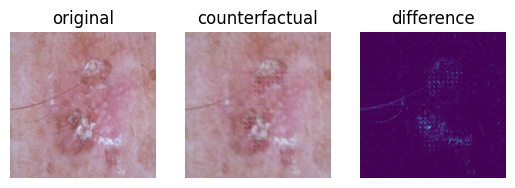

*** sample 2
[0.1147 0.3117 0.1147 0.1147 0.1147 0.1147 0.1147]
[0.1065 0.1107 0.1094 0.1844 0.1071 0.1062 0.2757]


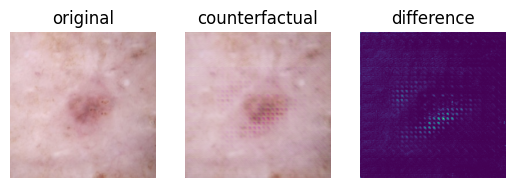

*** sample 3
[0.3116 0.115  0.1147 0.1147 0.1147 0.1147 0.1147]
[0.1096 0.1583 0.1141 0.2139 0.1084 0.1084 0.1873]


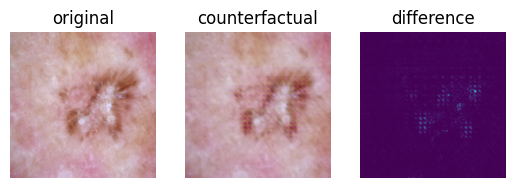

*** sample 4
[0.3118 0.1147 0.1147 0.1147 0.1147 0.1147 0.1147]
[0.1091 0.1163 0.1127 0.2813 0.1272 0.1088 0.1446]


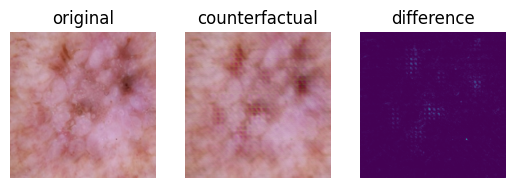

*** sample 5
[0.3118 0.1147 0.1147 0.1148 0.1147 0.1147 0.1147]
[0.1003 0.1016 0.1005 0.2399 0.1012 0.1002 0.2563]


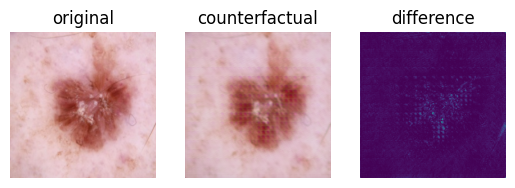

*** sample 6
[0.1111 0.1135 0.2673 0.1098 0.1098 0.1787 0.1098]
[0.1114 0.113  0.1342 0.2305 0.1118 0.1113 0.1878]


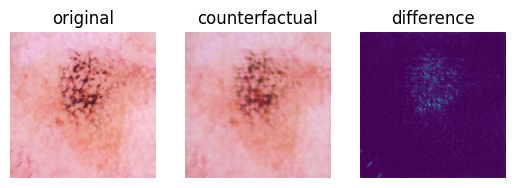

*** sample 7
[0.3047 0.1174 0.121  0.1144 0.1139 0.1146 0.114 ]
[0.1027 0.1031 0.1047 0.2074 0.1041 0.1027 0.2754]


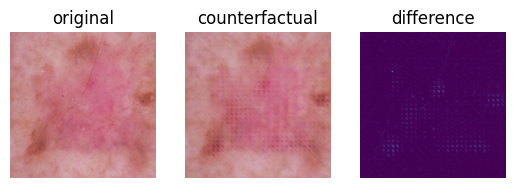

*** sample 8
[0.1304 0.1138 0.1147 0.1138 0.1146 0.299  0.1137]
[0.1122 0.1126 0.1142 0.1452 0.1123 0.1122 0.2913]


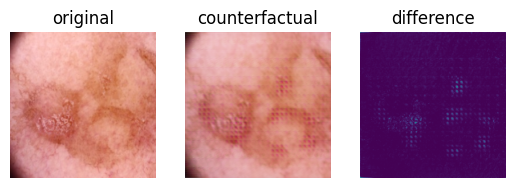

*** sample 9
[0.1561 0.2633 0.1308 0.112  0.112  0.1138 0.1121]
[0.1167 0.1375 0.1502 0.1773 0.1166 0.1171 0.1847]


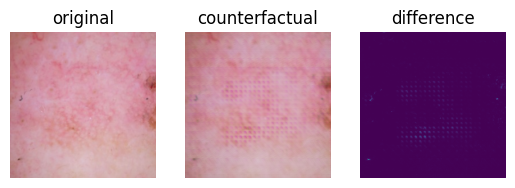

*** sample 10
[0.1195 0.1152 0.1153 0.1152 0.1166 0.3031 0.1152]
[0.1044 0.1047 0.1066 0.1965 0.1053 0.1044 0.2781]


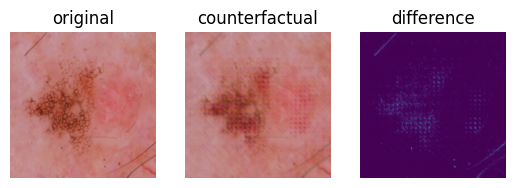

*** sample 11
[0.2673 0.2148 0.103  0.1062 0.1029 0.1029 0.1028]
[0.1048 0.1131 0.1059 0.1979 0.1057 0.1047 0.2677]


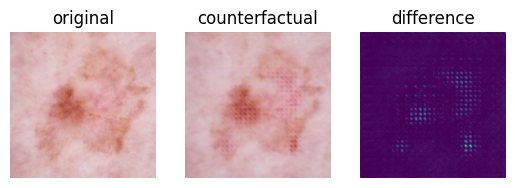

*** sample 12
[0.3118 0.1147 0.1147 0.1147 0.1147 0.1147 0.1147]
[0.0974 0.0982 0.0978 0.2566 0.0979 0.0974 0.2547]


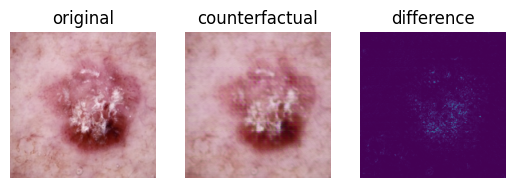

*** sample 13
[0.31   0.1197 0.114  0.1141 0.1141 0.114  0.114 ]
[0.1027 0.1422 0.1038 0.2072 0.1027 0.1016 0.2398]


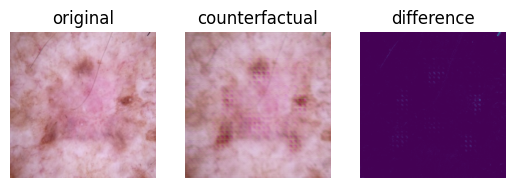

*** sample 14
[0.3115 0.1147 0.1148 0.1147 0.1149 0.1146 0.1147]
[0.1018 0.1033 0.1024 0.2208 0.1044 0.1017 0.2655]


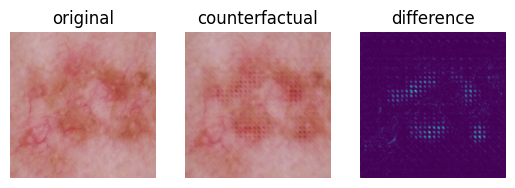

*** sample 15
[0.1278 0.1286 0.1261 0.1104 0.2864 0.1104 0.1104]
[0.1018 0.1062 0.1025 0.264  0.1051 0.1017 0.2187]


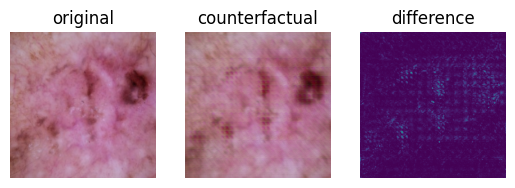

In [58]:
plot_generated_images(test_datagen[0][0], model, classifier)

1/1 [==============================] - 0s 32ms/step
(16, 256, 256, 3) (16, 7)
*** sample 0
[0.1147 0.1147 0.1147 0.1147 0.1147 0.3118 0.1147]
[0.1242 0.1242 0.2483 0.1245 0.1242 0.1289 0.1259]


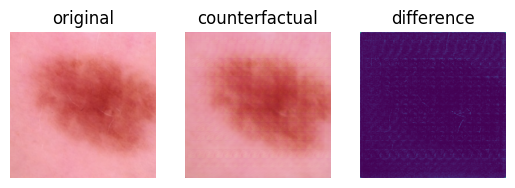

*** sample 1
[0.1146 0.1147 0.1146 0.1146 0.1152 0.3116 0.1146]
[0.1016 0.1027 0.1019 0.2255 0.1027 0.1018 0.2637]


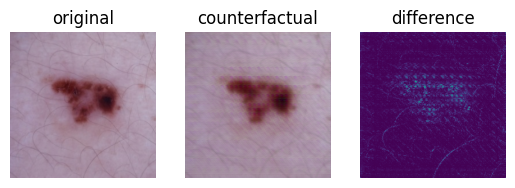

*** sample 2
[0.1147 0.1147 0.1147 0.1147 0.1147 0.3118 0.1147]
[0.1253 0.1253 0.2233 0.1267 0.1253 0.1474 0.1267]


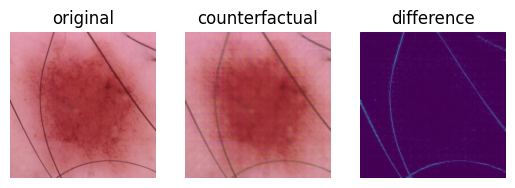

*** sample 3
[0.1147 0.1147 0.1147 0.1147 0.1147 0.3118 0.1147]
[0.1195 0.1195 0.1211 0.1291 0.1195 0.1204 0.2709]


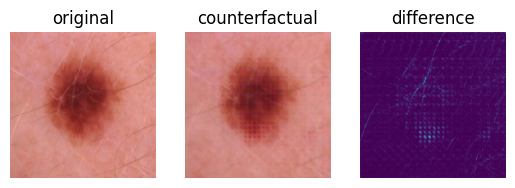

*** sample 4
[0.1147 0.1147 0.1147 0.1147 0.1147 0.3118 0.1147]
[0.1187 0.1187 0.2661 0.1189 0.1187 0.1399 0.1191]


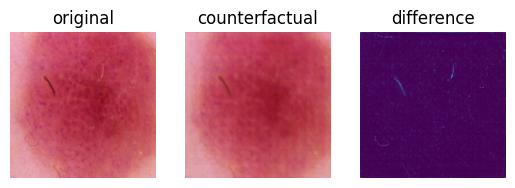

*** sample 5
[0.1147 0.1147 0.1147 0.1147 0.1147 0.3118 0.1147]
[0.1193 0.1194 0.1522 0.2096 0.1202 0.1204 0.1589]


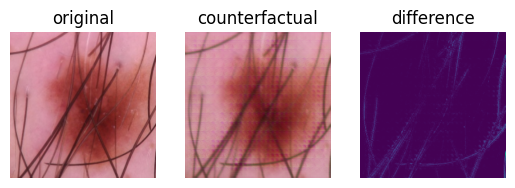

*** sample 6
[0.1147 0.1147 0.1147 0.1147 0.1147 0.3118 0.1147]
[0.1161 0.1161 0.1978 0.1726 0.1161 0.1176 0.1636]


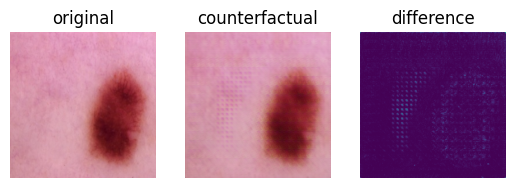

*** sample 7
[0.1147 0.1147 0.1147 0.1147 0.1147 0.3118 0.1147]
[0.1151 0.1151 0.3079 0.1151 0.1151 0.1164 0.1154]


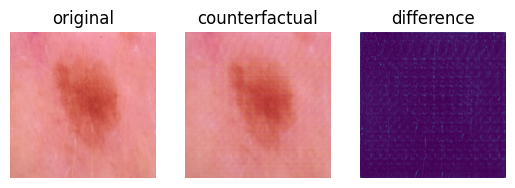

*** sample 8
[0.1147 0.1147 0.1147 0.1147 0.1147 0.3118 0.1147]
[0.1182 0.1182 0.2881 0.1185 0.1182 0.1196 0.1193]


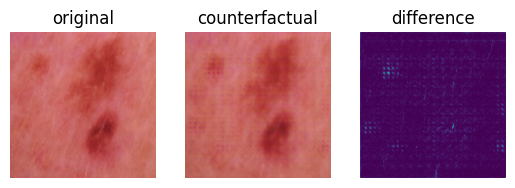

*** sample 9
[0.1148 0.1147 0.1147 0.1147 0.1147 0.3118 0.1147]
[0.1127 0.114  0.1157 0.151  0.1142 0.13   0.2624]


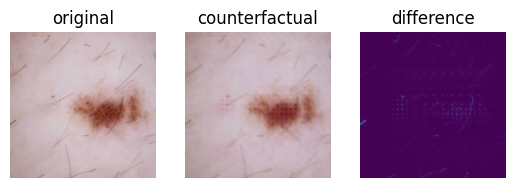

*** sample 10
[0.1147 0.1147 0.1147 0.1147 0.1147 0.3118 0.1147]
[0.1182 0.1182 0.1575 0.1207 0.1182 0.119  0.2482]


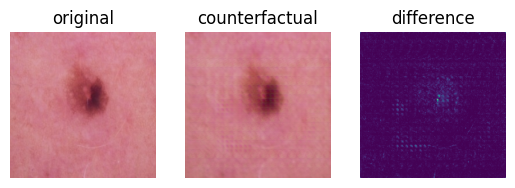

*** sample 11
[0.1147 0.1147 0.1147 0.1147 0.1147 0.3118 0.1147]
[0.1209 0.1209 0.2619 0.1212 0.1209 0.1324 0.1217]


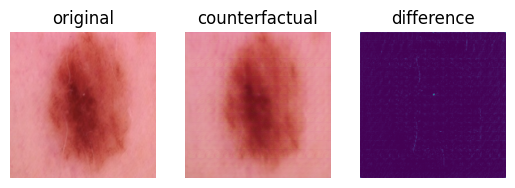

*** sample 12
[0.1147 0.1147 0.1147 0.1147 0.1147 0.3118 0.1147]
[0.121  0.121  0.2668 0.1214 0.121  0.1273 0.1217]


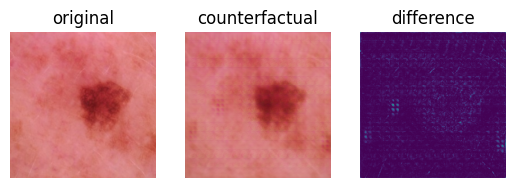

*** sample 13
[0.1147 0.1147 0.1147 0.1147 0.1147 0.3118 0.1147]
[0.1216 0.1216 0.2501 0.1232 0.1216 0.1225 0.1394]


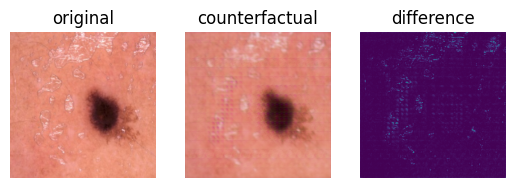

*** sample 14
[0.1147 0.1147 0.1147 0.1147 0.1147 0.3118 0.1147]
[0.1152 0.1152 0.3058 0.1159 0.1152 0.1163 0.1162]


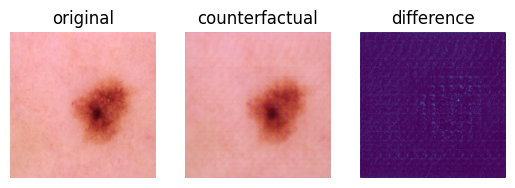

*** sample 15
[0.1147 0.1147 0.1147 0.1147 0.1147 0.3118 0.1147]
[0.1181 0.1181 0.2811 0.1184 0.1181 0.1264 0.1197]


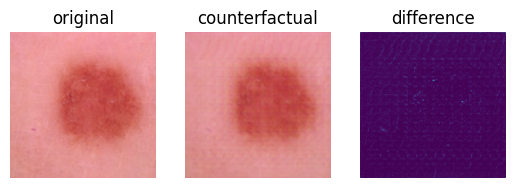

In [59]:
plot_generated_images(test_datagen[32][0], model, classifier)

1/1 [==============================] - 0s 29ms/step
(16, 256, 256, 3) (16, 7)
*** sample 0
[0.1147 0.1147 0.1147 0.1147 0.1147 0.3118 0.1147]
[0.101  0.1011 0.1013 0.2418 0.1011 0.1012 0.2526]


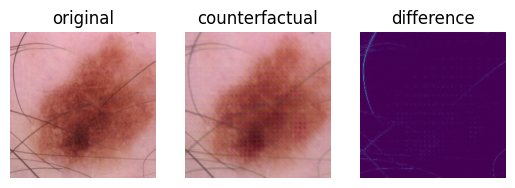

*** sample 1
[0.1148 0.1147 0.1147 0.1147 0.1147 0.3116 0.1147]
[0.1097 0.118  0.1127 0.1729 0.1114 0.1099 0.2653]


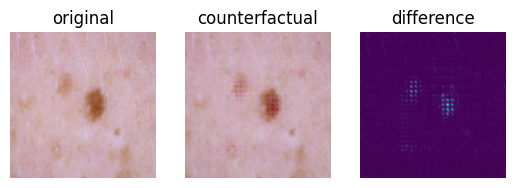

*** sample 2
[0.1147 0.1147 0.1147 0.1147 0.1147 0.3118 0.1147]
[0.116  0.116  0.3002 0.1166 0.116  0.1183 0.1169]


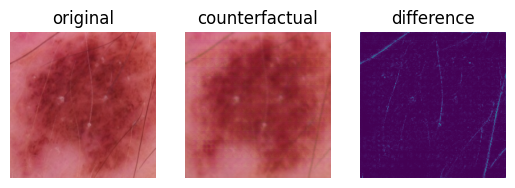

*** sample 3
[0.1147 0.1147 0.1148 0.1147 0.1147 0.3117 0.1147]
[0.128  0.128  0.1308 0.1394 0.128  0.1333 0.2126]


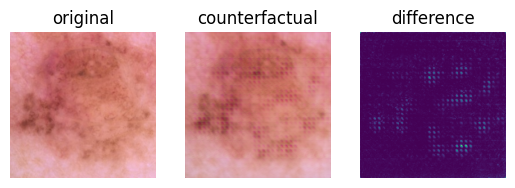

*** sample 4
[0.1147 0.1147 0.1147 0.1147 0.1147 0.3118 0.1147]
[0.115  0.115  0.3075 0.1151 0.115  0.116  0.1163]


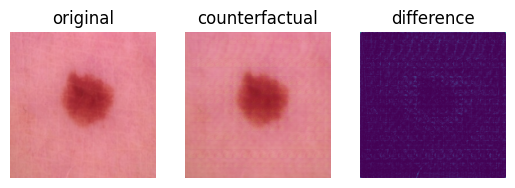

*** sample 5
[0.1147 0.1147 0.1147 0.1147 0.1147 0.3118 0.1147]
[0.1212 0.1212 0.2563 0.1218 0.1212 0.1357 0.1225]


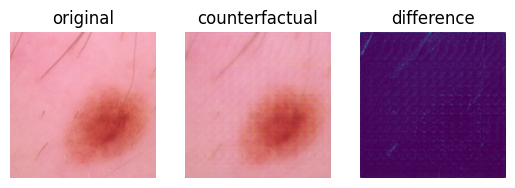

*** sample 6
[0.1147 0.1147 0.1147 0.1147 0.1147 0.3117 0.1147]
[0.1091 0.1195 0.1123 0.1665 0.11   0.1153 0.2674]


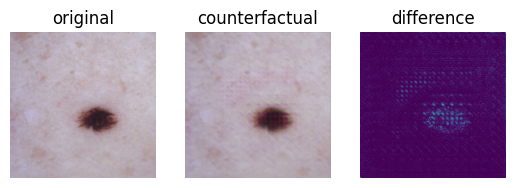

*** sample 7
[0.1147 0.1147 0.1147 0.1147 0.1147 0.3118 0.1147]
[0.1159 0.1159 0.2906 0.1161 0.1159 0.1294 0.1161]


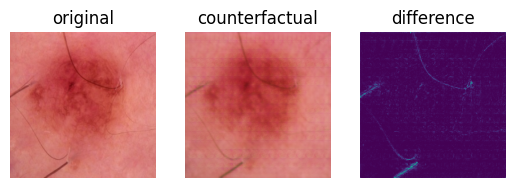

*** sample 8
[0.1147 0.1147 0.1147 0.1147 0.1147 0.3118 0.1147]
[0.1032 0.1033 0.1033 0.1117 0.1032 0.2106 0.2647]


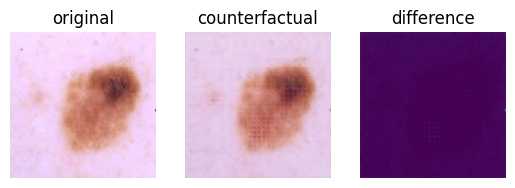

*** sample 9
[0.1147 0.1147 0.1147 0.1147 0.1147 0.3118 0.1147]
[0.1191 0.1191 0.2697 0.121  0.1191 0.1288 0.1231]


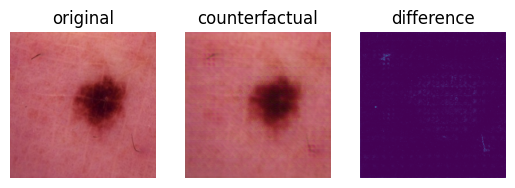

*** sample 10
[0.0993 0.0994 0.2589 0.0995 0.0993 0.2433 0.1003]
[0.1117 0.1117 0.1137 0.1362 0.112  0.1119 0.3027]


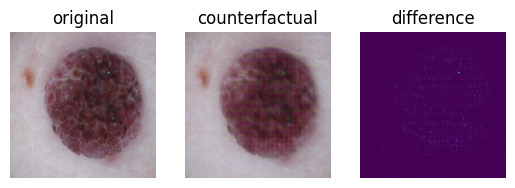

*** sample 11
[0.1147 0.1148 0.3116 0.1147 0.1147 0.1149 0.1147]
[0.1053 0.1167 0.1075 0.2249 0.1057 0.1054 0.2345]


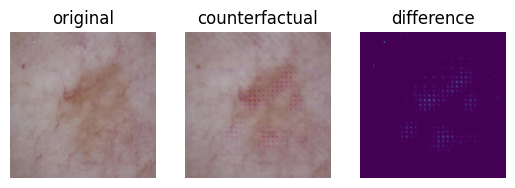

*** sample 12
[0.0997 0.1    0.2663 0.0997 0.0998 0.2347 0.0997]
[0.1071 0.1088 0.1085 0.1935 0.107  0.1077 0.2673]


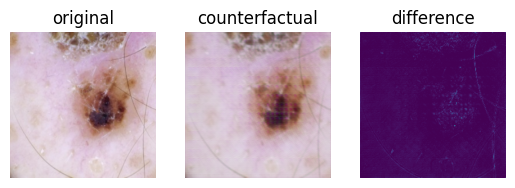

*** sample 13
[0.1147 0.1147 0.1147 0.1147 0.1147 0.3118 0.1147]
[0.1157 0.1157 0.3008 0.1163 0.1157 0.1179 0.118 ]


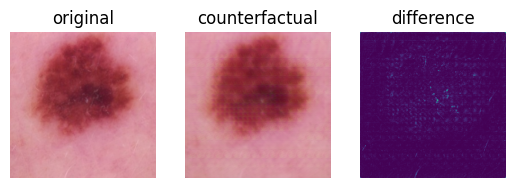

*** sample 14
[0.1147 0.1147 0.1147 0.1147 0.1147 0.3118 0.1147]
[0.1164 0.1164 0.2903 0.1167 0.1164 0.1266 0.1172]


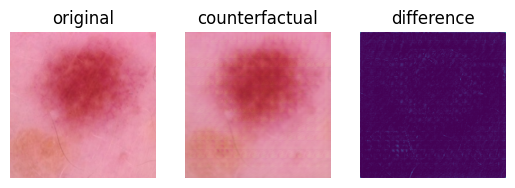

*** sample 15
[0.1024 0.2744 0.1024 0.1025 0.1025 0.2131 0.1027]
[0.1034 0.1932 0.1054 0.2006 0.1037 0.1035 0.1901]


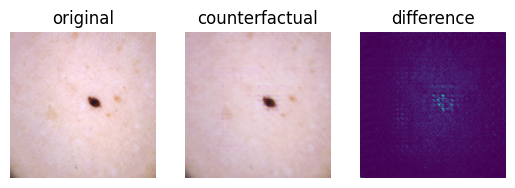

In [60]:
plot_generated_images(test_datagen[64][0], model, classifier)

# Evaluation - Confidence Diff

In [63]:
def compute_confidence_diff(datagen, tag_subset, generator, classifier):
    df = {'Y_cls_original':[],
          'Y_cls_counter':[]}
    for X, Ys in datagen:
        X_, _, _ = generator.predict(X, verbose=0)
        Y_cls_original = classifier.predict(X, verbose=0)
        Y_cls_counter = classifier.predict(X_, verbose=0)

        num = X.shape[0]
        Y_label = Ys['classifier256']
        class_ids = Y_label.argmax(axis=1)

        df['Y_cls_original'] += list(Y_cls_original[range(num), class_ids])
        df['Y_cls_counter'] += list(Y_cls_counter[range(num), class_ids])

        # print(class_ids)
        # print(Y_cls_original[range(num), class_ids])
        # print(Y_cls_counter[range(num), class_ids])

    df = pd.DataFrame(df)
    df.to_csv('eval_confidence_diff_%s.csv'%(tag_subset))

In [64]:
compute_confidence_diff(train_datagen, 'train', model, classifier)

In [65]:
compute_confidence_diff(val_datagen, 'val', model, classifier)

In [66]:
compute_confidence_diff(test_datagen, 'test', model, classifier)

In [31]:
def compute_result(filename):
    print(os.path.basename(filename))
    df = pd.read_csv(filename, header='infer')
    df['count_decline'] = (df['Y_cls_original'] > df['Y_cls_counter']).astype(int)
    df['percentage_decline'] = (df['Y_cls_original'] - df['Y_cls_counter']) / df['Y_cls_original']

    count_decline = df['count_decline'].sum() / df['count_decline'].count()
    percentage_decline = df[df['count_decline'] == 1]['percentage_decline'].mean()
    print('count_decline =', count_decline)
    print('percentage_decline =', percentage_decline)
    return df

In [33]:
df = compute_result(
    'outputs/confidence_diff_label_target_zero_onetenth_concept_directed/eval_confidence_diff_train.csv')
df = compute_result(
    'outputs/confidence_diff_label_target_zero_onetenth_concept_directed/eval_confidence_diff_val.csv')
df = compute_result(
    'outputs/confidence_diff_label_target_zero_onetenth_concept_directed/eval_confidence_diff_test.csv')

eval_confidence_diff_train.csv
count_decline = 0.9962037962037962
percentage_decline = 0.6114135452112303
eval_confidence_diff_val.csv
count_decline = 0.9745
percentage_decline = 0.5508044360707052
eval_confidence_diff_test.csv
count_decline = 0.9764119601328903
percentage_decline = 0.5443826278115368
